# **Implementing Ultralytics for custom dataset**

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt comet_ml  # install

import torch
import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 v7.0-306-gb599ae42 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 28.9/78.2 GB disk)


In [ ]:
!pip install roboflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.6/74.6 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 13.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 17.6 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.9.0.80
    Uninstalling opencv-python-headless-4.9.0.80:
      Successfully uninstalled opencv-python-headless-4.9.0.80
  Attempting uninstall: idna
    Found existing installation: idna 3.7
    Uninstalling idna-3.7:
      Successfully uninstalled idna-3.7
  Attempting uninstall: cycler
    Found existing installation: cycler 0.12.1
    Uninstalling cycler-0.12.1:
      Successfully uninstalled cycler-0.12.1
  Attempting uninstall: chardet
    Found existing installation: chardet 5.2

In [ ]:


%cd yolov5
from roboflow import Roboflow
rf = Roboflow(api_key="Hq4y0Y55XHQxzkxw48Hh")
project = rf.workspace("cv-lftqv").project("object-detection-bjher")
version = project.version(5)
dataset = version.download("yolov5")

/content/yolov5
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Object-Detection-5 in yolov5pytorch:: 100%|██████████| 2010/2010 [00:00<00:00, 7398.45it/s]


In [ ]:
# %rm -r /content/Object-Detection-5

In [ ]:
#@title Select YOLOv5 🚀 logger {run: 'auto'}
logger = 'Comet' #@param ['Comet', 'ClearML', 'TensorBoard']

if logger == 'Comet':
  %pip install -q comet_ml
  import comet_ml; comet_ml.init()
elif logger == 'ClearML':
  %pip install -q clearml
  import clearml; clearml.browser_login()
elif logger == 'TensorBoard':
  %load_ext tensorboard
  %tensorboard --logdir runs/train

Please paste your Comet API key from https://www.comet.com/api/my/settings/
(api key may not show as you type)
Comet API key: ··········


COMET INFO: Valid Comet API Key saved in /root/.comet.config (set COMET_CONFIG to change where it is saved).


# Training ...

In [ ]:
# %cd yolov5
!python train.py --img 640 --batch 32 --epochs 150 --data /content/yolov5/Object-Detection-5/data.yaml --weights yolov5s.pt

2024-04-29 18:44:56.474108: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-29 18:44:56.474161: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-29 18:44:56.475527: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/yolov5/Object-Detection-5/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=, multi_

# Running tensorboard for visualizing training *runs*

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

# Visualizing ground truth images

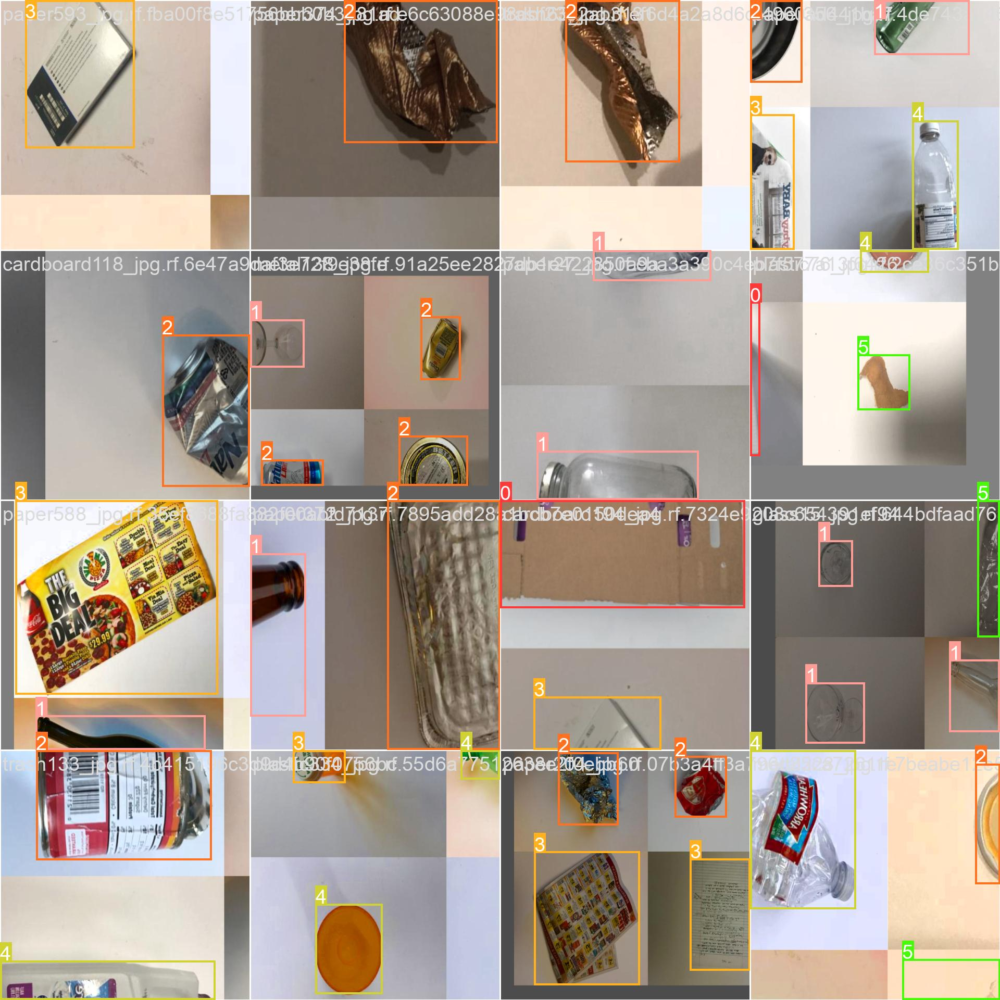

In [ ]:
from IPython.display import Image  # for displaying images
Image(filename='/content/yolov5/runs/train/exp/train_batch0.jpg')

# Running model on test set using detect.py to setup for visualization

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img 640 --conf 0.5 --source /content/yolov5/Object-Detection-5/test/images

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/Object-Detection-5/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-306-gb599ae42 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
image 1/101 /content/yolov5/Object-Detection-5/test/images/cardboard134_jpg.rf.b7a904132c06c06b177085e3b1d33406.jpg: 640x640 1 cardboard, 11.6ms
image 2/101 /content/yolov5/Object-Detection-5/test/images/cardboard147_jpg.rf.d2e00cd0c2186654ddf9a35b72a92a6e.jpg: 640x640 1 cardboard, 11.7

# Visualizing model results on test set

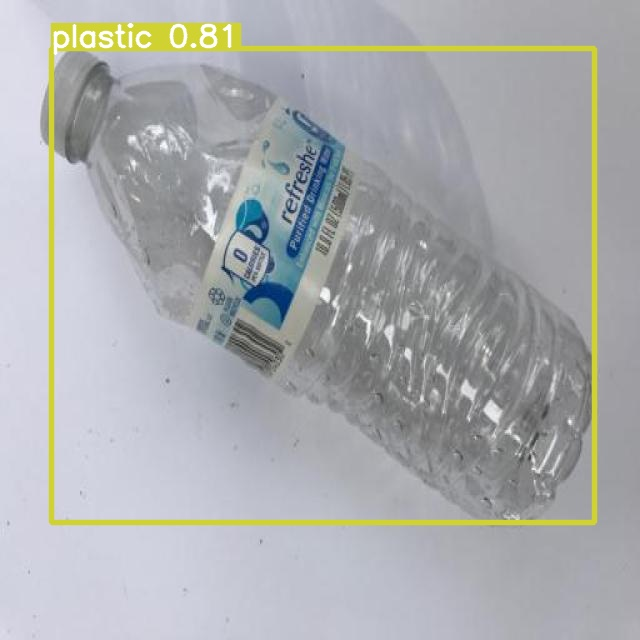

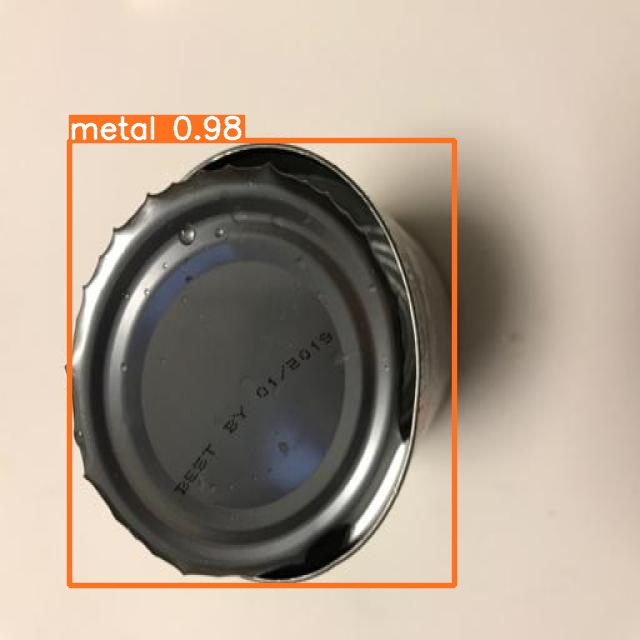

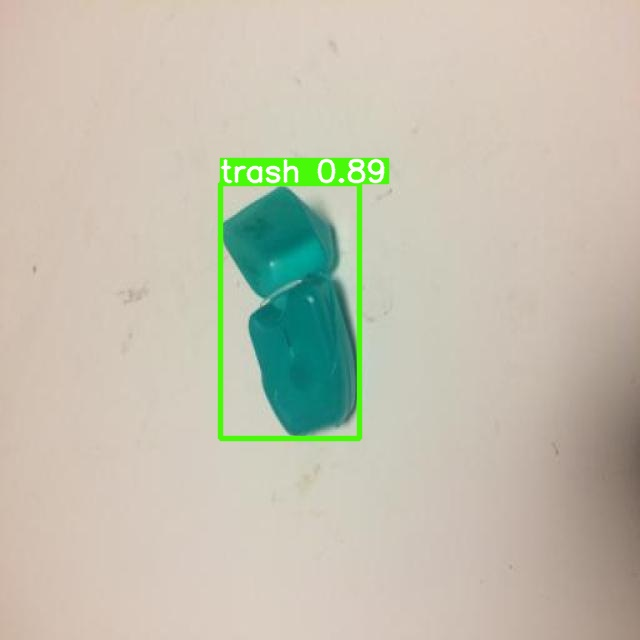

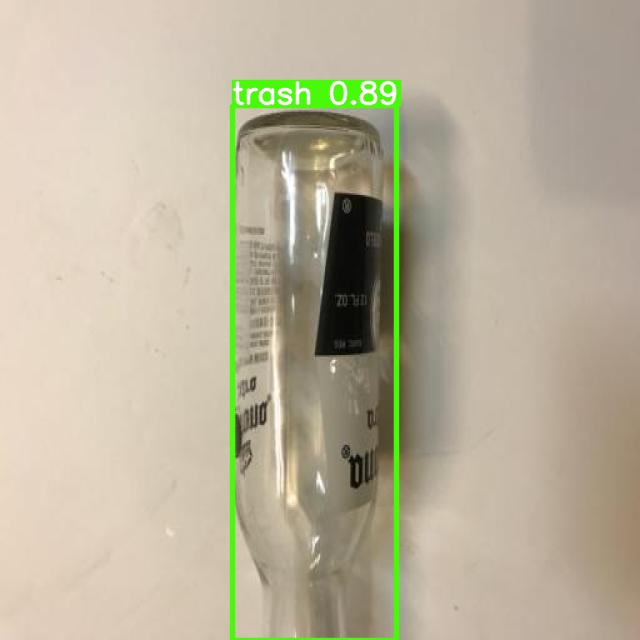

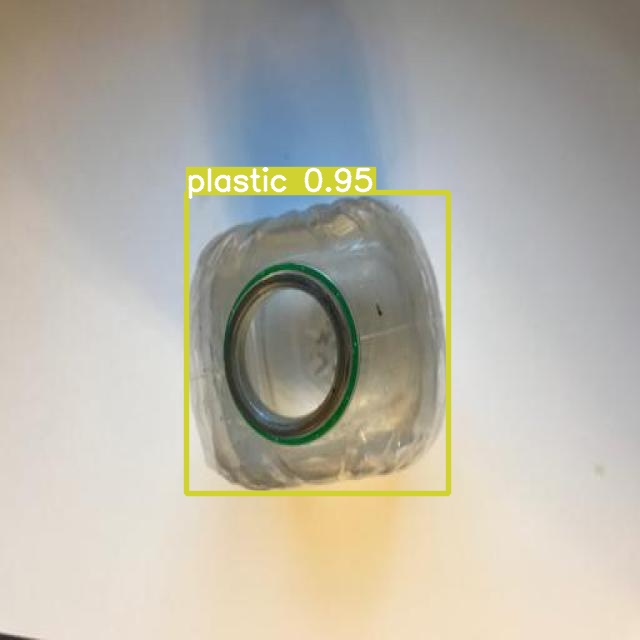

...

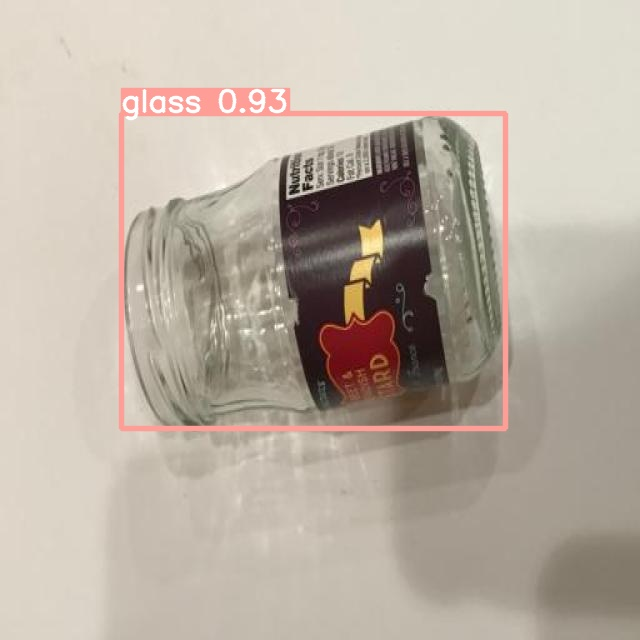

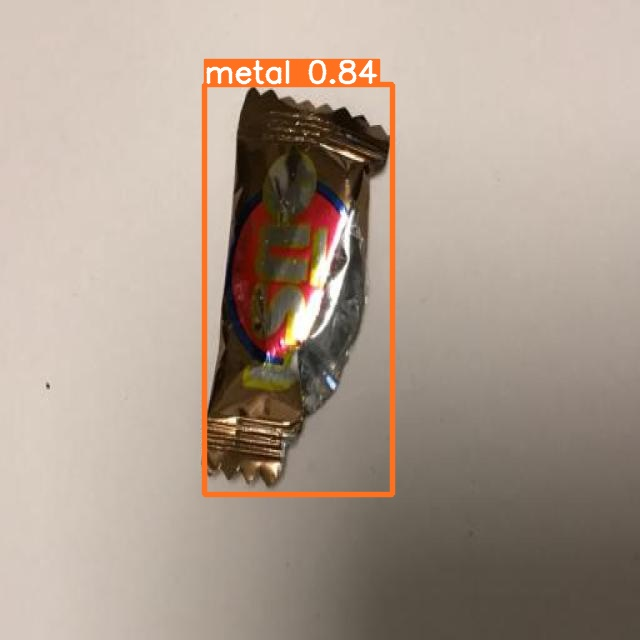

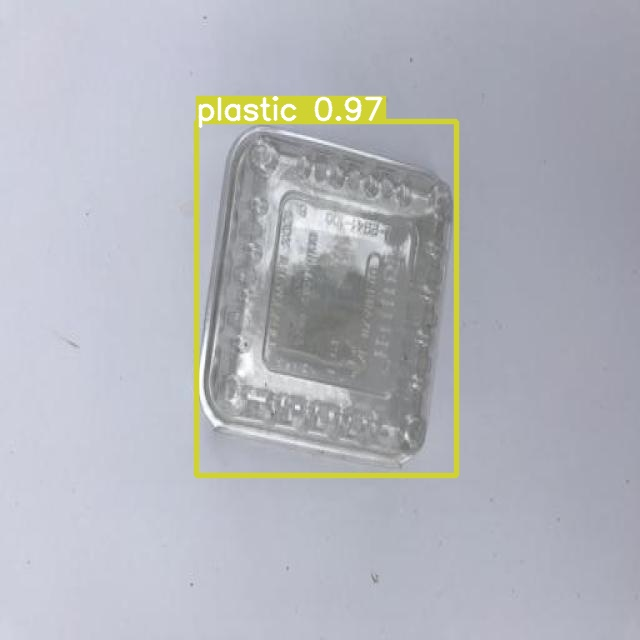

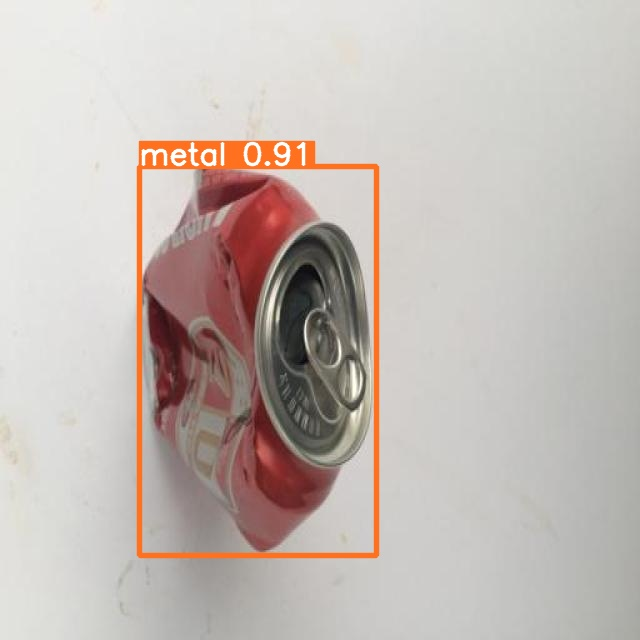

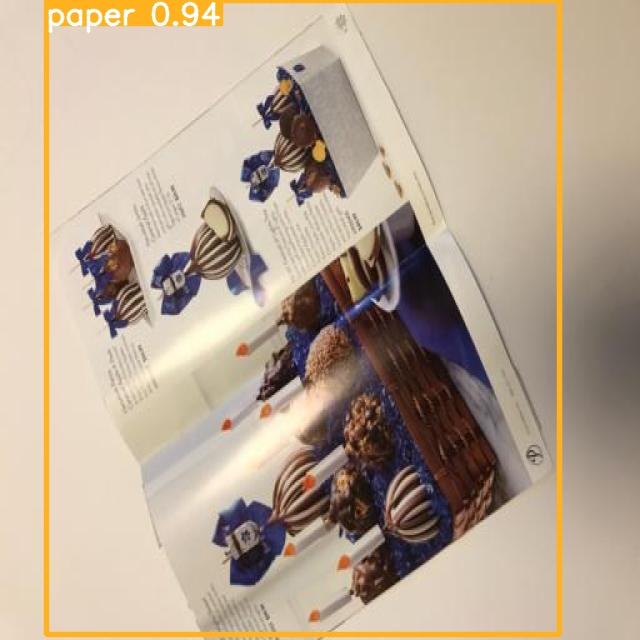

In [ ]:
import glob

from IPython.display import Image, display

for ImageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'):
  display(Image(filename=ImageName))
  print("\n")

# Running model on test set

In [ ]:
!python val.py --data /content/yolov5/Object-Detection-5/data.yaml --weights /content/yolov5/runs/train/exp/weights/best.pt --task test

val: data=/content/yolov5/Object-Detection-5/data.yaml, weights=['/content/yolov5/runs/train/exp/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-306-gb599ae42 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
test: Scanning /content/yolov5/Object-Detection-5/test/labels... 101 images, 0 backgrounds, 0 corrupt: 100% 101/101 [00:00<00:00, 1130.16it/s]
test: New cache created: /content/yolov5/Ob

In [ ]:
!unzip /content/CV-obejct.v2i.yolov5pytorch.zip

Archive:  /content/CV-obejct.v2i.yolov5pytorch.zip
   creating: CV-obejct.v2i.yolov5pytorch/
  inflating: CV-obejct.v2i.yolov5pytorch/data.yaml  
  inflating: CV-obejct.v2i.yolov5pytorch/README.dataset.txt  
  inflating: CV-obejct.v2i.yolov5pytorch/README.roboflow.txt  
   creating: CV-obejct.v2i.yolov5pytorch/train/
   creating: CV-obejct.v2i.yolov5pytorch/train/images/
  inflating: CV-obejct.v2i.yolov5pytorch/train/images/IMG_1668_jpg.rf.3c492a1e27b4ead57186300ec050f96f.jpg  
  inflating: CV-obejct.v2i.yolov5pytorch/train/images/IMG_1669_jpg.rf.beff492fef5e440b8071aca9c79c4a5a.jpg  
   creating: CV-obejct.v2i.yolov5pytorch/train/labels/
  inflating: CV-obejct.v2i.yolov5pytorch/train/labels/IMG_1668_jpg.rf.3c492a1e27b4ead57186300ec050f96f.txt  
  inflating: CV-obejct.v2i.yolov5pytorch/train/labels/IMG_1669_jpg.rf.beff492fef5e440b8071aca9c79c4a5a.txt  


In [ ]:
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img 640 --conf 0.1 --source /content/yolov5/CV-obejct.v2i.yolov5pytorch/train/images

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/CV-obejct.v2i.yolov5pytorch/train/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-305-g4456c953 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
image 1/2 /content/yolov5/CV-obejct.v2i.yolov5pytorch/train/images/IMG_1668_jpg.rf.3c492a1e27b4ead57186300ec050f96f.jpg: 640x640 1 plastic, 3 trashs, 11.6ms
image 2/2 /content/yolov5/CV-obejct.v2i.yolov5pytorch/train/images/IMG_1669_jpg.rf.beff492fef5e440b8071aca9c79c4a5a.jpg:

In [ ]:
import glob

from IPython.display import Image, display

for ImageName in glob.glob('/content/yolov5/runs/detect/exp3/*.jpg'):
  display(Image(filename=ImageName))
  print("\n")

In [ ]:
!python val.py --data /content/yolov5/Object-Detection-5/data.yaml --weights /content/yolov5/runs/train/exp/weights/best.pt

val: data=/content/yolov5/Object-Detection-5/data.yaml, weights=['/content/yolov5/runs/train/exp/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-306-gb599ae42 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/yolov5/Object-Detection-5/valid/labels.cache... 200 images, 0 backgrounds, 0 corrupt: 100% 200/200 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances    